In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import mutual_info_classif

Data is ultimately coming from this location:
https://www.kaggle.com/datasets/adityakadiwal/water-potability

In [2]:
url = 'https://raw.githubusercontent.com/JGasior-AI/WaterPotabilityDeepLearning/refs/heads/main/water_potability_raw.csv'
df = pd.read_csv(url)
df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0


In [3]:
df.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


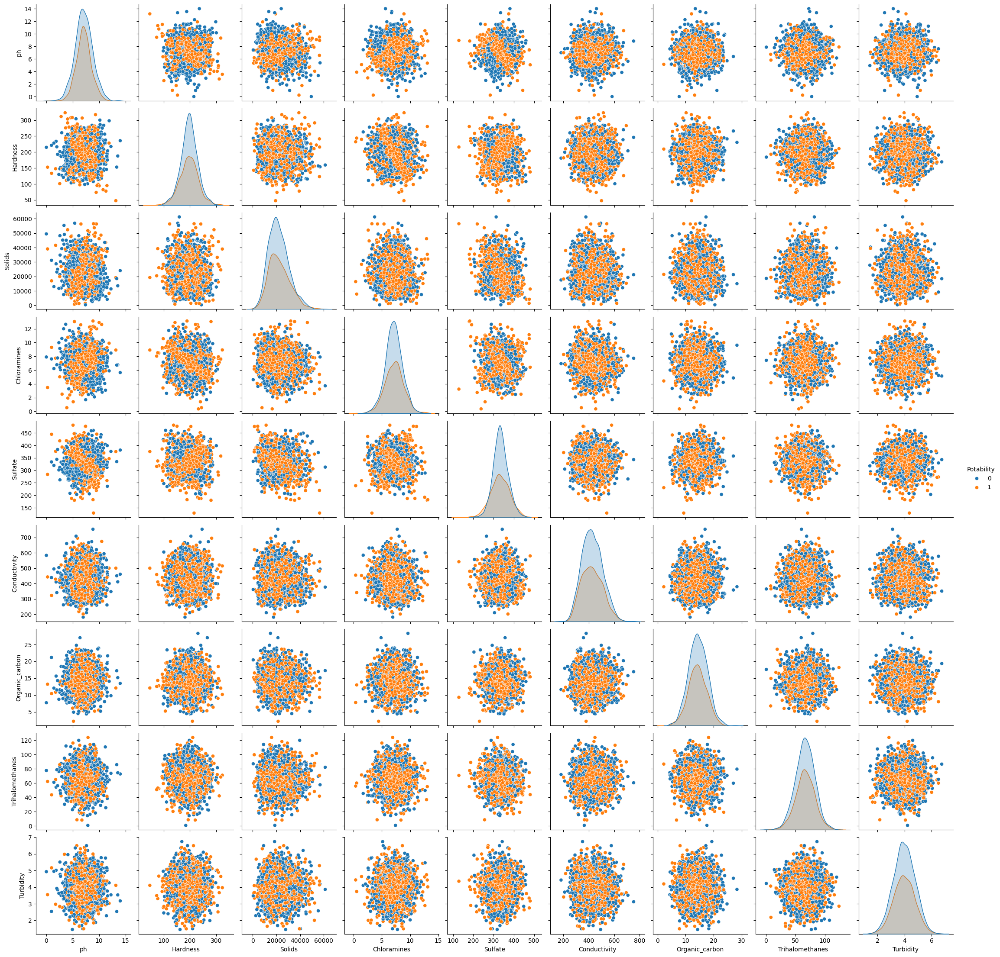

In [35]:
sns.pairplot(df, hue="Potability")

In [4]:
# drop rows that contain NaN in any columns. Since the data is normally distributed, we could use the mean as well.
df_cleaned = df.dropna()
df_cleaned.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


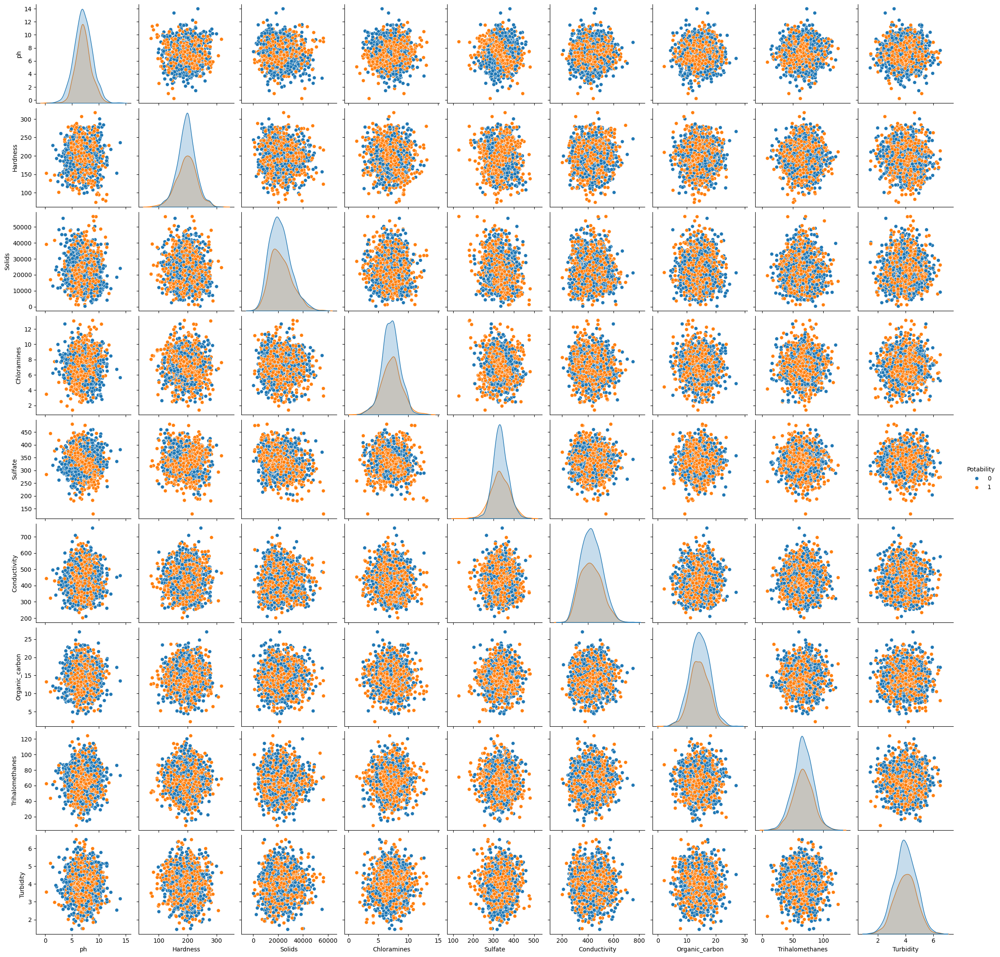

In [5]:
sns.pairplot(df_cleaned, hue="Potability")

## Comments on Data

All features look to be normally distributed. There are more data points in the 'not potable' class (class 0). Unfortuantely, all of the features look to be very mixed, with no clear boundary separations. Expect the tuning the model for a high accuracy objective to be difficult

In [6]:
df_cleaned['Potability'].value_counts()

,count
Potability,
0,1200
1,811


In [7]:
df_cleaned.to_csv('water_potability_cleaned.csv', index=False)

Correlation Matrix

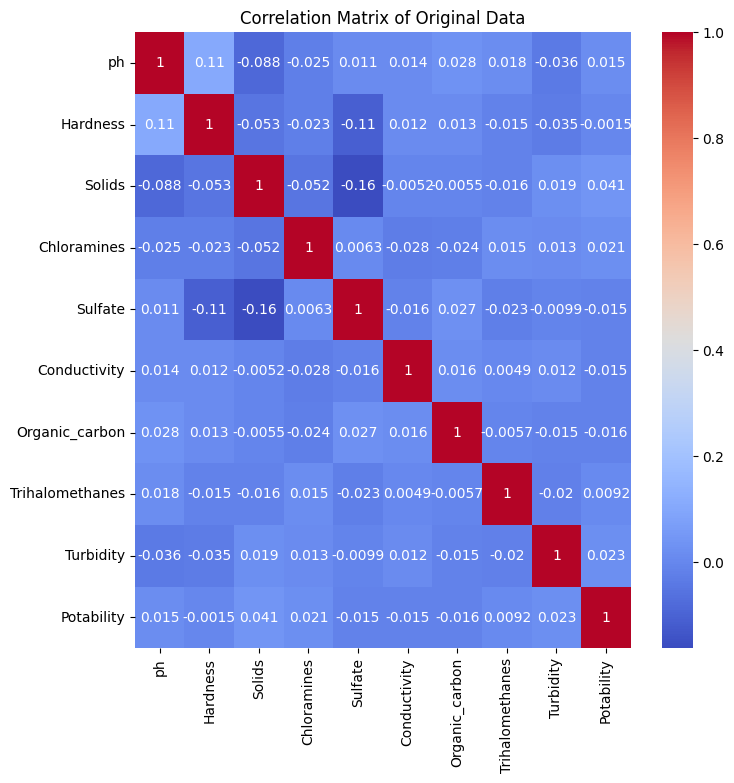

In [8]:
corr_matrix = df_cleaned.corr()
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Original Data')
plt.show()

In [9]:
corr_matrix

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.108948,-0.087615,-0.024768,0.010524,0.014128,0.028375,0.018278,-0.035849,0.014530
Hardness,0.108948,1.000000,-0.053269,-0.022685,-0.108521,0.011731,0.013224,-0.015400,-0.034831,-0.001505
Solids,-0.087615,-0.053269,1.000000,-0.051789,-0.162769,-0.005198,-0.005484,-0.015668,0.019409,0.040674
Chloramines,-0.024768,-0.022685,-0.051789,1.000000,0.006254,-0.028277,-0.023808,0.014990,0.013137,0.020784
Sulfate,0.010524,-0.108521,-0.162769,0.006254,1.000000,-0.016192,0.026776,-0.023347,-0.009934,-0.015303
Conductivity,0.014128,0.011731,-0.005198,-0.028277,-0.016192,1.000000,0.015647,0.004888,0.012495,-0.015496
Organic_carbon,0.028375,0.013224,-0.005484,-0.023808,0.026776,0.015647,1.000000,-0.005667,-0.015428,-0.015567
Trihalomethanes,0.018278,-0.015400,-0.015668,0.014990,-0.023347,0.004888,-0.005667,1.000000,-0.020497,0.009244
Turbidity,-0.035849,-0.034831,0.019409,0.013137,-0.009934,0.012495,-0.015428,-0.020497,1.000000,0.022682
Potability,0.014530,-0.001505,0.040674,0.020784,-0.015303,-0.015496,-0.015567,0.009244,0.022682,1.000000


In [36]:
#top 5 features correlated with potability
df_cleaned.corr()['Potability'].sort_values(ascending=False).head(10)

,Potability
Potability,1.000000
Solids,0.040674
Turbidity,0.022682
Chloramines,0.020784
ph,0.014530
Trihalomethanes,0.009244
Hardness,-0.001505
Sulfate,-0.015303
Conductivity,-0.015496
Organic_carbon,-0.015567


In [11]:
#let's look at mutual information
X, y = df_cleaned.drop('Potability', axis=1), df_cleaned['Potability']
mi_scores = mutual_info_classif(X, y)
mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
mi_scores = mi_scores.sort_values(ascending=False)
mi_scores


,MI Scores
Sulfate,0.016167
ph,0.011711
Organic_carbon,0.009949
Hardness,0.007390
Conductivity,0.004854
Chloramines,0.000000
Solids,0.000000
Trihalomethanes,0.000000
Turbidity,0.000000


There is low feature correlation with potabiltiy (no strong linear relationship). Using these features on their own would not be sufficient to predict potability. The SNS plot also shows that clustering of this classes in each feature pairing would be difficult.

Also, there does not seem to be any strong collinearity issues feature-to-feature, meaning we can safely use all features without worrying about redundancy.

Sulfates tell us the most about the potability of the water

**Feature Engineering**

We will create a new feature using the most highly correlated features, solids and sulfates. The new feature will be Solids / Sulfates

In [12]:
solidsulfates_ratio = df_cleaned['Solids'] / df_cleaned['Sulfate']
df_fe = df_cleaned.copy()
df_fe.insert(0, 'Solids/Sulfate', solidsulfates_ratio)
df_fe.head()

,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
3,61.695917,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,57.971347,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,88.003036,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,73.031216,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,45.076331,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0


In [13]:
df_fe.describe()

,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,67.491504,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729,0.403282
std,30.944347,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346,0.490678
min,0.954908,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000,0.000000
25%,46.022053,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915,0.000000
50%,62.999570,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177,0.000000
75%,84.026104,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175,1.000000
max,437.896685,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749,1.000000


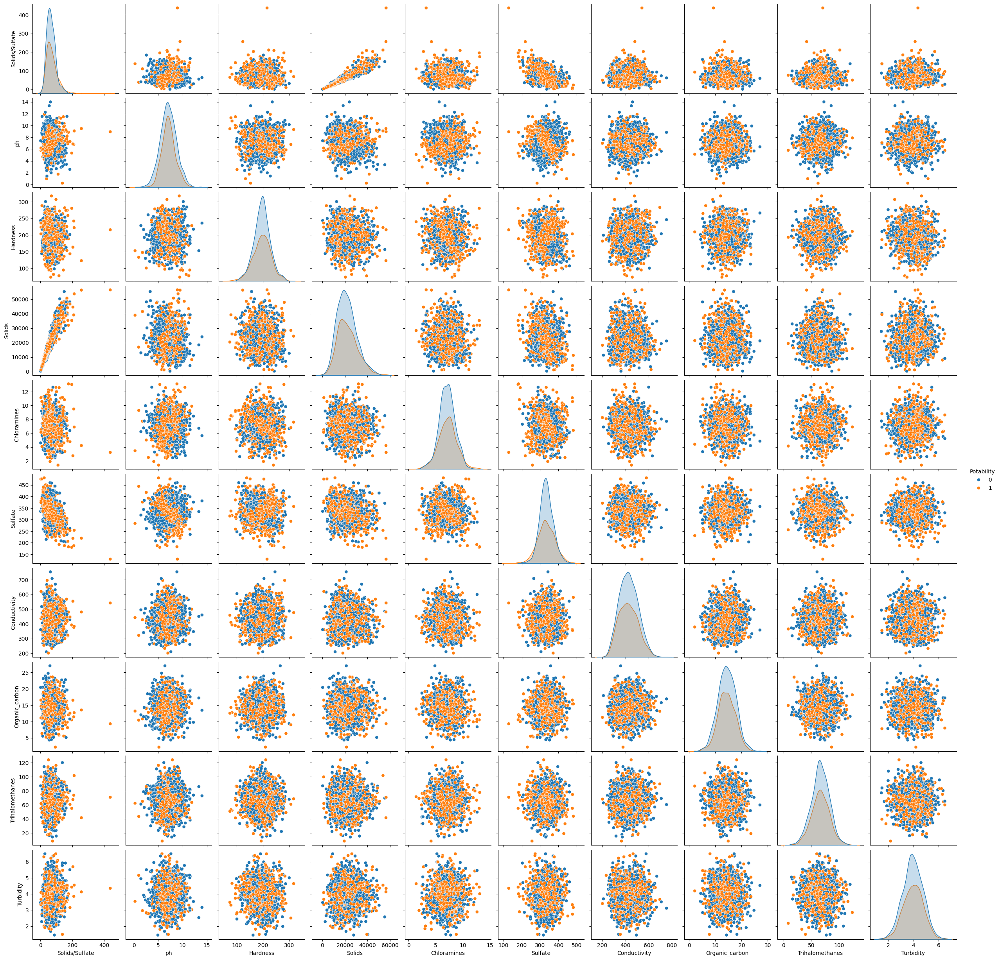

In [14]:
sns.pairplot(df_fe, hue="Potability")

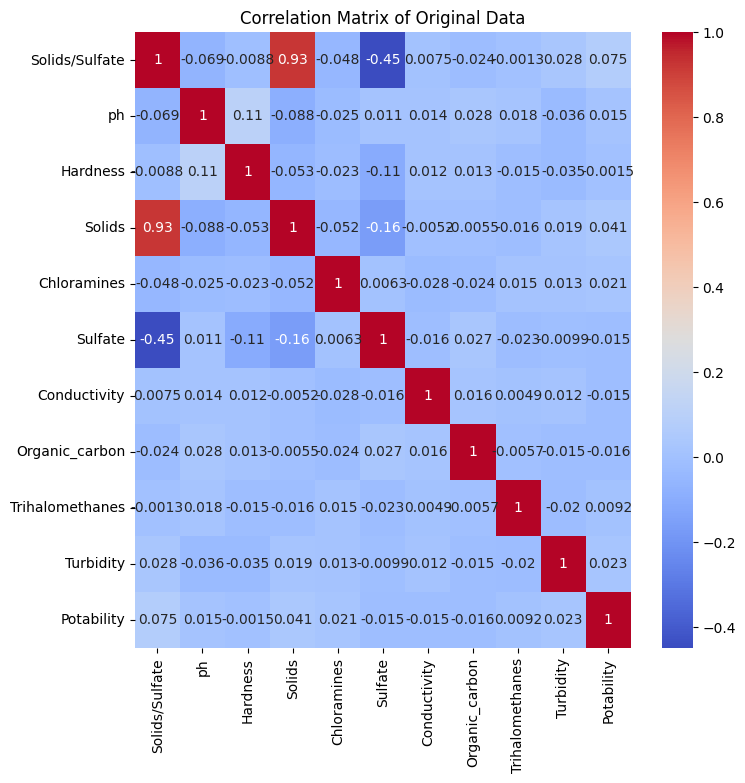

In [15]:
corr_matrix = df_fe.corr()
plt.figure(figsize=(8, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Original Data')
plt.show()

In [16]:
#top 5 highest correlated features with potability
df_fe.corr()['Potability'].sort_values(ascending=False).head(6)

,Potability
Potability,1.000000
Solids/Sulfate,0.074579
Solids,0.040674
Turbidity,0.022682
Chloramines,0.020784
ph,0.014530


Looks like there still aren't many features that correlate well with potabiltiy. Will try polynomial transforms to see if we can gain some information

# Creating new Polynomial Features

Let's see if creating polynomial features will improve the correlations to potability

In [17]:
features = df_fe.drop('Potability', axis=1)
label = df_fe['Potability']

In [18]:
label.value_counts()

,count
Potability,
0,1200
1,811


In [19]:
label.head()

,Potability
3,0
4,0
5,0
6,0
7,0


In [20]:
#remove empty first

In [21]:
features.head()

,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
3,61.695917,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771
4,57.971347,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075
5,88.003036,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708
6,73.031216,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989
7,45.076331,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425


In [22]:
features.describe()

,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
count,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,67.491504,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,3.969729
std,30.944347,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,0.780346
min,0.954908,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,1.450000
25%,46.022053,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,3.442915
50%,62.999570,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,3.968177
75%,84.026104,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,4.514175
max,437.896685,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,6.494749


In [23]:
poly = PolynomialFeatures(degree=2)
poly_data = poly.fit_transform(features)
poly_df = pd.DataFrame(poly_data, columns=poly.get_feature_names_out(features.columns))

In [24]:
poly_df.head()

,1,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,...,Conductivity^2,Conductivity Organic_carbon,Conductivity Trihalomethanes,Conductivity Turbidity,Organic_carbon^2,Organic_carbon Trihalomethanes,Organic_carbon Turbidity,Trihalomethanes^2,Trihalomethanes Turbidity,Turbidity^2
0,1.0,61.695917,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,...,131962.561766,6697.372024,36450.770473,1681.477347,339.905435,1849.951737,85.338441,10068.451614,464.458586,21.425517
1,1.0,57.971347,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,...,158731.176220,4604.943514,12748.346309,1623.554115,133.593824,369.841742,47.100861,1023.871539,130.394234,16.606240
2,1.0,88.003036,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,...,78662.251868,2355.856069,15402.698258,717.916032,70.555542,461.295466,21.500870,3015.971549,140.573703,6.552106
3,1.0,73.031216,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,...,80458.249192,3911.469602,23997.936909,758.197622,190.155697,1166.657262,36.859700,7157.761717,226.144353,7.144869
4,1.0,45.076331,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,...,225252.416638,5867.961926,29804.557523,2088.949819,152.863963,776.426781,54.418408,3943.627609,276.402029,19.372540


In [25]:
poly_df.describe()

,1,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,...,Conductivity^2,Conductivity Organic_carbon,Conductivity Trihalomethanes,Conductivity Turbidity,Organic_carbon^2,Organic_carbon Trihalomethanes,Organic_carbon Turbidity,Trihalomethanes^2,Trihalomethanes Turbidity,Turbidity^2
count,2011.0,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,...,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,1.0,67.491504,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,...,188436.057248,6128.139193,28328.060334,1693.980752,217.193672,953.061434,56.956202,4667.419044,263.336378,16.367384
std,0.0,30.944347,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,...,71093.933205,1855.420049,8828.715296,469.896324,96.548760,324.909716,17.323296,2156.415730,82.772480,6.233563
min,1.0,0.954908,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,...,40650.518249,833.573817,3134.706256,509.729039,4.840000,127.974313,9.222966,73.565151,18.712591,2.102500
25%,1.0,46.022053,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,...,134454.462755,4841.450807,22180.373865,1348.035582,146.993929,720.800272,44.953869,3130.700624,205.532631,11.853667
50%,1.0,62.999570,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,...,179314.904055,5990.993223,27695.874264,1661.096083,205.120225,932.337186,55.770110,4427.864121,255.851093,15.746429
75%,1.0,84.026104,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,...,232683.879965,7262.174029,33826.097085,1986.245963,278.324137,1151.832477,68.281524,5974.041765,313.763321,20.377780
max,1.0,437.896685,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,...,567525.102443,12744.975700,68632.269389,3750.358214,729.362202,2284.878298,134.766473,15376.000000,579.133143,42.181759


In [26]:
#convert labels and poly_df to numpy and combine
labels = np.array(label)
poly_df_np = poly_df.to_numpy()

#combine poly_df_np and labels
data = np.concatenate((poly_df_np, labels.reshape(-1, 1)), axis=1)

In [27]:
#convert back to pd dataframe
columns = poly_df.columns.tolist()
columns.append('Potability')
df_fe2 = pd.DataFrame(data, columns=columns)

In [28]:
df_fe2.head()

,1,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,...,Conductivity Organic_carbon,Conductivity Trihalomethanes,Conductivity Turbidity,Organic_carbon^2,Organic_carbon Trihalomethanes,Organic_carbon Turbidity,Trihalomethanes^2,Trihalomethanes Turbidity,Turbidity^2,Potability
0,1.0,61.695917,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,...,6697.372024,36450.770473,1681.477347,339.905435,1849.951737,85.338441,10068.451614,464.458586,21.425517,0.0
1,1.0,57.971347,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,...,4604.943514,12748.346309,1623.554115,133.593824,369.841742,47.100861,1023.871539,130.394234,16.606240,0.0
2,1.0,88.003036,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,...,2355.856069,15402.698258,717.916032,70.555542,461.295466,21.500870,3015.971549,140.573703,6.552106,0.0
3,1.0,73.031216,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,...,3911.469602,23997.936909,758.197622,190.155697,1166.657262,36.859700,7157.761717,226.144353,7.144869,0.0
4,1.0,45.076331,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,...,5867.961926,29804.557523,2088.949819,152.863963,776.426781,54.418408,3943.627609,276.402029,19.372540,0.0


In [29]:
df_fe2.describe()

,1,Solids/Sulfate,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,...,Conductivity Organic_carbon,Conductivity Trihalomethanes,Conductivity Turbidity,Organic_carbon^2,Organic_carbon Trihalomethanes,Organic_carbon Turbidity,Trihalomethanes^2,Trihalomethanes Turbidity,Turbidity^2,Potability
count,2011.0,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,...,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000,2011.000000
mean,1.0,67.491504,7.085990,195.968072,21917.441374,7.134338,333.224672,426.526409,14.357709,66.400859,...,6128.139193,28328.060334,1693.980752,217.193672,953.061434,56.956202,4667.419044,263.336378,16.367384,0.403282
std,0.0,30.944347,1.573337,32.635085,8642.239815,1.584820,41.205172,80.712572,3.324959,16.077109,...,1855.420049,8828.715296,469.896324,96.548760,324.909716,17.323296,2156.415730,82.772480,6.233563,0.490678
min,1.0,0.954908,0.227499,73.492234,320.942611,1.390871,129.000000,201.619737,2.200000,8.577013,...,833.573817,3134.706256,509.729039,4.840000,127.974313,9.222966,73.565151,18.712591,2.102500,0.000000
25%,1.0,46.022053,6.089723,176.744938,15615.665390,6.138895,307.632511,366.680307,12.124105,55.952664,...,4841.450807,22180.373865,1348.035582,146.993929,720.800272,44.953869,3130.700624,205.532631,11.853667,0.000000
50%,1.0,62.999570,7.027297,197.191839,20933.512750,7.143907,332.232177,423.455906,14.322019,66.542198,...,5990.993223,27695.874264,1661.096083,205.120225,932.337186,55.770110,4427.864121,255.851093,15.746429,0.000000
75%,1.0,84.026104,8.052969,216.441070,27182.587067,8.109726,359.330555,482.373169,16.683049,77.291925,...,7262.174029,33826.097085,1986.245963,278.324137,1151.832477,68.281524,5974.041765,313.763321,20.377780,1.000000
max,1.0,437.896685,14.000000,317.338124,56488.672413,13.127000,481.030642,753.342620,27.006707,124.000000,...,12744.975700,68632.269389,3750.358214,729.362202,2284.878298,134.766473,15376.000000,579.133143,42.181759,1.000000


In [30]:
corr_matrix = df_fe2.corr()
plt.figure(figsize=(100, 100))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Feature Engineered Data')
plt.show()

In [37]:
#the top five highest correlated features to potabiltiy
df_fe2.corr()['Potability'].sort_values(ascending=False).head(11)

,Potability
Potability,1.000000
Solids/Sulfate ph,0.108745
Solids/Sulfate^2,0.088910
Solids/Sulfate Trihalomethanes,0.076359
Solids/Sulfate Turbidity,0.075691
Solids/Sulfate,0.074579
Solids/Sulfate Solids,0.072820
ph Solids,0.070659
Solids/Sulfate Conductivity,0.065829
Solids/Sulfate Hardness,0.063010


In [39]:
#lets take a look at mutual information of this new dataset

X, y = df_fe2.drop('Potability', axis=1), df_fe2['Potability']
mi_scores = mutual_info_classif(X, y)
mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
mi_scores = mi_scores.sort_values(ascending=False)
mi_scores.head(10)


,MI Scores
Sulfate Organic_carbon,0.019716
Hardness Turbidity,0.018726
Solids/Sulfate Organic_carbon,0.016927
Sulfate^2,0.016208
Sulfate,0.016167
Solids Turbidity,0.015153
Hardness Sulfate,0.014780
Solids/Sulfate^2,0.014234
Solids/Sulfate,0.014203
Hardness Conductivity,0.014190


We have increased the number of features that have higher correlation with each other which makes sense. However, the new features do not significantly show higher correlation with Potability. We will try running the FNN with this dataset. The polynomial features also add look like they have better mutual information than just sulfates alone

In [33]:
df_fe.to_csv('water_potability_featureengineered.csv', index=False)

In [34]:
df_fe2.to_csv('water_potability_featureengineered2.csv', index=False)

Measuring